# Etude des données

In [127]:
# Librairies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import scipy
import scipy.stats
import time
import tensorflow as tf

# Machine learning
# pip install tensorflow

from sklearn.model_selection import train_test_split
from sklearn.datasets import load_boston
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential

In [128]:
#Etiquetage de chaque colonne 
index = ['Fichier', 'Score', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10', 'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18']

# Légende
#'S1':'Largeur moyenne', 
#'S2':'Écart type sur la largeur',
#'S3':'Envergure moyenne',
#'S4':'Écart type sur l’envergure',
#'S5':'Profondeur moyenne',
#'S6':'Écart-type sur la profondeur',
#'S7':'Longueur de la première et de la dernière arête',
#'S8':'Longueur moyenne de la plus grande arête',
#'S9':'Longueur de la plus grande arête de chaque tournée, divisée par la longueur de la tournée',
#'S10':'Longueur de la plus grande arête intérieure de chaque tournée (arête non connectée au dépôt), divisée par la longueur de la tournée',
#'S11':'Longueur moyenne de la première et de la dernière arête de chaque tournée',
#'S12':'Demande du premier et dernier client de chaque tournée, divisée par la charge du véhicule',
#'S13':'Demande du client le plus éloigné du dépôt, pour chaque tournée, divisée par la charge du véhicule',
#'S14':'Écart type sur la demande du client le plus éloigné du dépôt',
#'S15':'Écart type sur la longueur de chaque tournée',
#'S16':'Distance (euclidienne) moyenne entre les centre de gravité tournées',
#'S17':'Écart type sur le nombre de client de chaque tournée',
#'S18':'Degré de chaque voisinage moyen des clients'.


# Regroupement par fichier. 
keys1 = ["01", "02", "03", "04", "05", "06", "07", "08", "09","10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21", "22", "23", "24", "25", "26", "27"]
keys2 = ["01", "02", "03", "04", "05", "06", "07", "08", "09","10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21", "22", "23", "24", "25", "26"]

#Concatenation de tous les fichiers. 
files1 = glob.glob("HGS/2113/XML100_2113_*.csv")
files2 = glob.glob("HGS/2213/XML100_2213_*.csv")
files3 = glob.glob("HGS/3113/XML100_3113_*.csv")
files4 = glob.glob("HGS/3213/XML100_3213_*.csv")

data_center_random = pd.concat([pd.read_csv(f,sep=";", names = index) for f in files1], keys = keys1)
data_center_cluster = pd.concat([pd.read_csv(f,sep=";", names = index) for f in files2], keys = keys1)
data_coin_random = pd.concat([pd.read_csv(f,sep=";", names = index) for f in files3], keys = keys2)
data_coin_cluster = pd.concat([pd.read_csv(f,sep=";", names = index) for f in files4], keys = keys2)

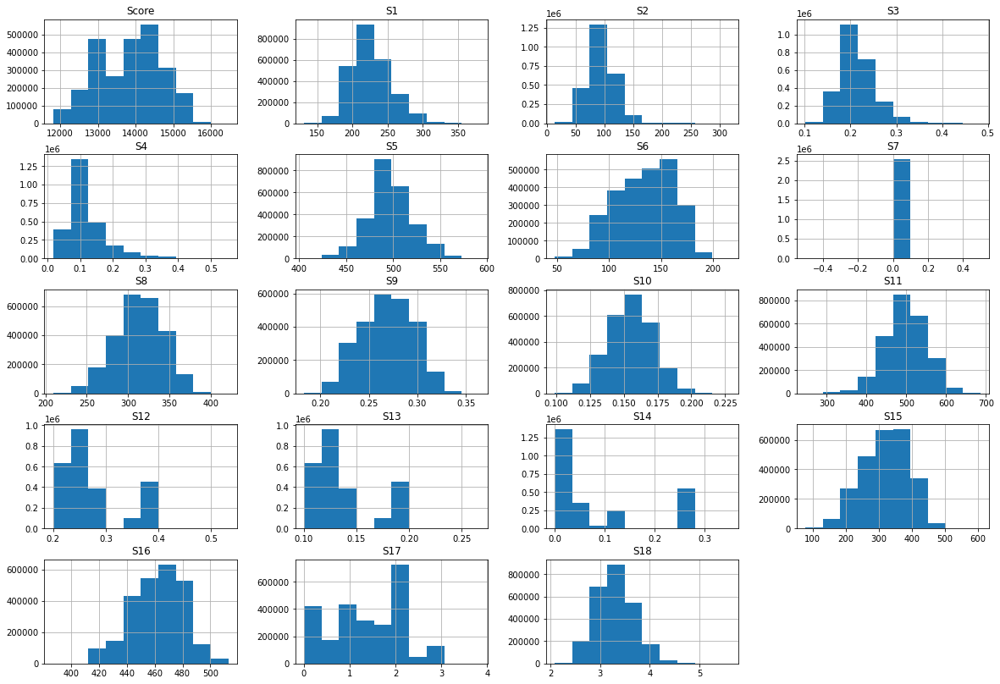

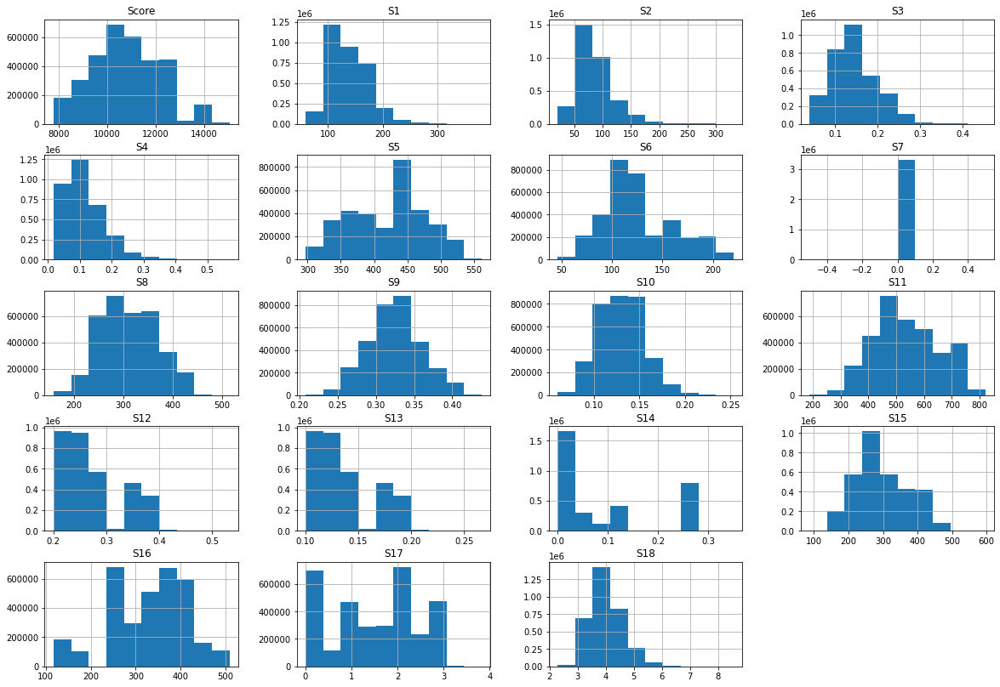

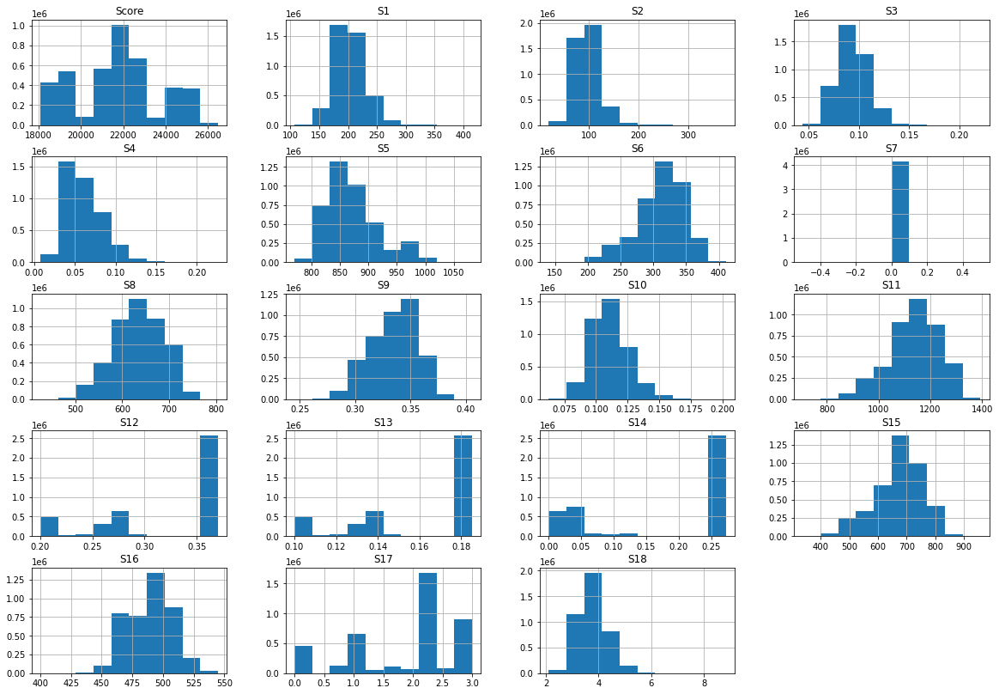

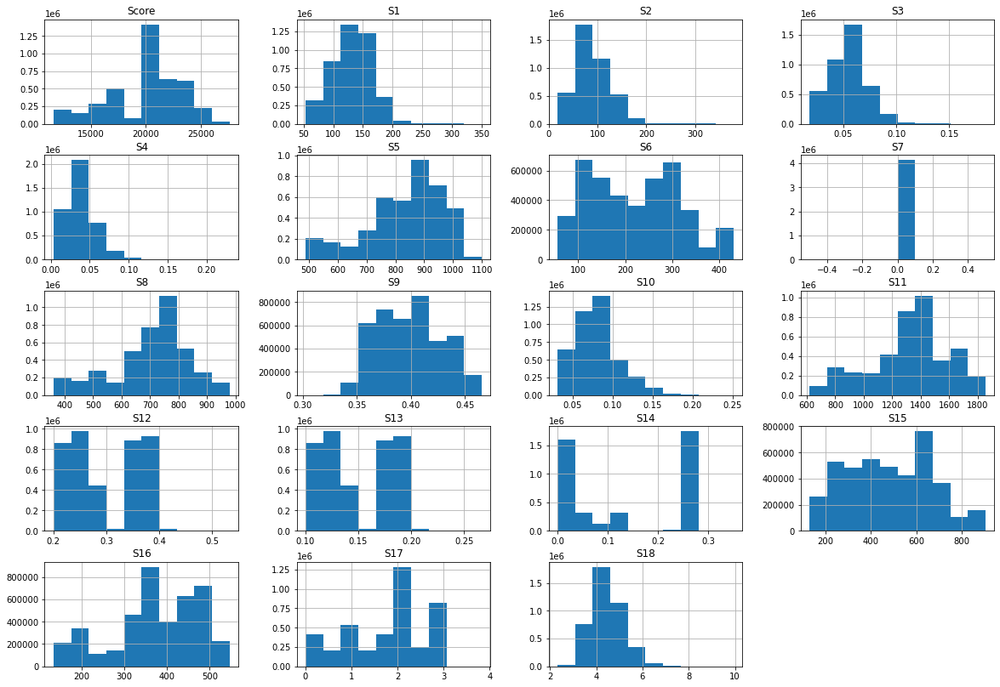

In [129]:
hist1 = data_center_random.hist(figsize=(20,14))
hist2 = data_center_cluster.hist(figsize=(20,14))
hist3 = data_coin_random.hist(figsize=(20,14))
hist4 = data_coin_cluster.hist(figsize=(20,14))

In [130]:
corr1 = data_center_random.corr()
corr2 = data_center_cluster.corr()
corr3 = data_coin_random.corr()
corr4 = data_coin_cluster.corr()
corr1

,Score,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,S11,S12,S13,S14,S15,S16,S17,S18
Score,1.000000,-0.491763,-0.236689,-0.344582,-0.062702,-0.106104,-0.012551,NaN,0.665667,0.739226,0.278481,0.716825,0.206912,0.206922,-0.098700,-0.140545,0.381033,-0.144097,0.090457
S1,-0.491763,1.000000,0.396860,0.732552,0.279234,0.173287,-0.008012,NaN,-0.168544,-0.482786,-0.358920,-0.158697,-0.234580,-0.234562,-0.012749,0.069988,0.059164,-0.137887,-0.225830
S2,-0.236689,0.396860,1.000000,0.151629,0.079261,-0.260788,0.240971,NaN,-0.210642,-0.076841,-0.284737,-0.131793,0.238376,0.238339,0.333195,0.517511,-0.341007,0.395595,-0.199237
S3,-0.344582,0.732552,0.151629,1.000000,0.721021,0.027160,0.107671,NaN,-0.135282,-0.367344,-0.153688,-0.101639,-0.222734,-0.222718,-0.085177,0.014077,-0.045300,-0.217440,-0.131187
S4,-0.062702,0.279234,0.079261,0.721021,1.000000,-0.038783,0.130685,NaN,0.016446,-0.067077,-0.123382,0.061086,0.046479,0.046500,0.086322,-0.048240,0.013393,-0.116548,-0.059481
S5,-0.106104,0.173287,-0.260788,0.027160,-0.038783,1.000000,-0.682829,NaN,0.185118,-0.348650,0.110902,-0.099417,-0.533539,-0.533472,-0.409270,-0.699550,0.630209,-0.514035,0.369863
S6,-0.012551,-0.008012,0.240971,0.107671,0.130685,-0.682829,1.000000,NaN,-0.316210,0.147283,-0.320179,-0.135455,0.689066,0.689019,0.668507,0.893060,-0.405839,0.693328,-0.472718
S7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
S8,0.665667,-0.168544,-0.210642,-0.135282,0.016446,0.185118,-0.316210,NaN,1.000000,0.777101,0.164168,0.837575,-0.086328,-0.086285,-0.264165,-0.414144,0.647369,-0.375168,-0.030912
S9,0.739226,-0.482786,-0.076841,-0.367344,-0.067077,-0.348650,0.147283,NaN,0.777101,1.000000,0.105914,0.754542,0.397461,0.397456,0.145489,0.066759,0.232257,0.131704,-0.185039


In [5]:
corr2

,Score,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,S11,S12,S13,S14,S15,S16,S17,S18
Score,1.000000,0.027192,-0.048318,-0.458867,-0.334981,0.755056,-0.428153,NaN,0.756928,0.517039,-0.140195,0.748830,-0.204390,-0.204528,-0.373647,-0.476017,0.545377,-0.299457,0.057284
S1,0.027192,1.000000,0.720842,0.598968,0.325369,0.157091,0.095586,NaN,-0.055751,-0.546216,0.358901,-0.145024,-0.181648,-0.181618,-0.030608,0.310692,0.510938,-0.043751,-0.111890
S2,-0.048318,0.720842,1.000000,0.442787,0.378365,0.014595,0.189102,NaN,-0.037456,-0.292140,0.161023,-0.092421,-0.043245,-0.043189,0.067815,0.498469,0.163697,0.000992,0.030321
S3,-0.458867,0.598968,0.442787,1.000000,0.816637,-0.462583,0.555254,NaN,-0.571078,-0.741628,0.605851,-0.684355,0.036448,0.036498,0.140503,0.601566,0.087381,0.137668,-0.028446
S4,-0.334981,0.325369,0.378365,0.816637,1.000000,-0.343388,0.488317,NaN,-0.359994,-0.435633,0.396285,-0.451453,0.125479,0.125538,0.190427,0.470807,-0.039744,0.107518,0.083835
S5,0.755056,0.157091,0.014595,-0.462583,-0.343388,1.000000,-0.569320,NaN,0.910164,0.427372,-0.210940,0.861039,-0.418660,-0.418743,-0.379109,-0.549396,0.435779,-0.350563,0.177353
S6,-0.428153,0.095586,0.189102,0.555254,0.488317,-0.569320,1.000000,NaN,-0.568173,-0.472584,0.348582,-0.598881,0.429099,0.429143,0.446199,0.904651,-0.002807,0.509718,-0.119619
S7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
S8,0.756928,-0.055751,-0.037456,-0.571078,-0.359994,0.910164,-0.568173,NaN,1.000000,0.724958,-0.367723,0.958864,-0.333012,-0.333093,-0.346676,-0.567941,0.266054,-0.324446,0.110994
S9,0.517039,-0.546216,-0.292140,-0.741628,-0.435633,0.427372,-0.472584,NaN,0.724958,1.000000,-0.580467,0.757352,0.043955,0.043892,-0.087890,-0.529976,-0.136599,-0.108653,-0.027353


In [6]:
corr3

,Score,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,S11,S12,S13,S14,S15,S16,S17,S18
Score,1.000000,-0.414833,-0.341980,-0.047527,0.097056,0.197291,-0.324733,NaN,0.731193,0.728925,0.307829,0.777390,-0.301564,-0.301581,-0.534531,-0.419759,-0.335381,-0.563510,0.175210
S1,-0.414833,1.000000,0.465096,0.734794,0.279718,-0.022135,0.060716,NaN,-0.121483,-0.334236,-0.236201,-0.104194,-0.072864,-0.072843,0.052646,0.139557,0.096766,0.054976,-0.273112
S2,-0.341980,0.465096,1.000000,0.272650,0.180906,-0.467337,0.390912,NaN,-0.412760,-0.146058,-0.206529,-0.389014,0.397058,0.397056,0.428541,0.523615,0.213976,0.456061,-0.203627
S3,-0.047527,0.734794,0.272650,1.000000,0.718851,-0.049068,0.141192,NaN,0.046891,-0.085600,0.009626,0.073183,-0.156736,-0.156711,-0.139229,0.097197,0.064844,-0.110052,-0.159875
S4,0.097056,0.279718,0.180906,0.718851,1.000000,-0.054040,0.249565,NaN,0.058391,0.049420,0.036646,0.082938,0.031332,0.031371,-0.000639,0.126589,0.204419,-0.032630,-0.057486
S5,0.197291,-0.022135,-0.467337,-0.049068,-0.054040,1.000000,-0.742100,NaN,0.563285,-0.174580,0.393750,0.443315,-0.780740,-0.780713,-0.699169,-0.795813,-0.370531,-0.723078,0.456304
S6,-0.324733,0.060716,0.390912,0.141192,0.249565,-0.742100,1.000000,NaN,-0.619374,-0.063606,-0.307721,-0.538617,0.778804,0.778795,0.751040,0.954721,0.731365,0.785187,-0.322809
S7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
S8,0.731193,-0.121483,-0.412760,0.046891,0.058391,0.563285,-0.619374,NaN,1.000000,0.667822,0.184948,0.936258,-0.625200,-0.625190,-0.726347,-0.691351,-0.348600,-0.789290,-0.012596
S9,0.728925,-0.334236,-0.146058,-0.085600,0.049420,-0.174580,-0.063606,NaN,0.667822,1.000000,-0.094508,0.678057,0.017852,0.017838,-0.185865,-0.122974,-0.086180,-0.233533,-0.314760


In [7]:
corr4

,Score,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,S11,S12,S13,S14,S15,S16,S17,S18
Score,1.000000,-0.195219,-0.211945,-0.636256,-0.326054,0.814404,-0.133031,NaN,0.891826,0.718329,-0.343489,0.885387,-0.033708,-0.033655,-0.202124,-0.192890,0.126861,-0.240742,0.091010
S1,-0.195219,1.000000,0.717708,0.649701,0.519997,0.181034,0.317282,NaN,0.013400,-0.518315,0.400909,-0.053694,-0.028258,-0.028251,0.198819,0.392090,0.626054,0.197992,-0.023452
S2,-0.211945,0.717708,1.000000,0.506829,0.641737,0.007862,0.200062,NaN,-0.074106,-0.331410,0.251519,-0.109816,0.099329,0.099326,0.248802,0.302295,0.307350,0.221415,0.075390
S3,-0.636256,0.649701,0.506829,1.000000,0.796388,-0.499285,0.459178,NaN,-0.609820,-0.749538,0.588909,-0.663378,0.084358,0.084340,0.231447,0.508938,0.325454,0.149819,-0.001020
S4,-0.326054,0.519997,0.641737,0.796388,1.000000,-0.269728,0.392007,NaN,-0.332807,-0.456909,0.436731,-0.382811,0.202122,0.202124,0.282015,0.437019,0.290928,0.156633,0.063403
S5,0.814404,0.181034,0.007862,-0.499285,-0.269728,1.000000,-0.089882,NaN,0.951499,0.427123,-0.159721,0.903286,-0.183055,-0.183009,-0.168110,-0.114362,0.391924,-0.117394,0.131707
S6,-0.133031,0.317282,0.200062,0.459178,0.392007,-0.089882,1.000000,NaN,-0.245163,-0.552138,0.725116,-0.368491,0.390945,0.391008,0.428786,0.990162,0.654699,0.308902,0.269045
S7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
S8,0.891826,0.013400,-0.074106,-0.609820,-0.332807,0.951499,-0.245163,NaN,1.000000,0.667577,-0.356486,0.979605,-0.198561,-0.198527,-0.247698,-0.278527,0.213314,-0.210034,0.001756
S9,0.718329,-0.518315,-0.331410,-0.749538,-0.456909,0.427123,-0.552138,NaN,0.667577,1.000000,-0.736837,0.736181,-0.077804,-0.077803,-0.279924,-0.598128,-0.397490,-0.255879,-0.231927


Les variables S12 et S13 sont correlés donc nous allons en retenir qu'un des deux. 

In [131]:

from scipy.stats import pearsonr
data = {'resultat_test_1': pearsonr(data_center_random['S12'], data_center_random['S13']), 'resultat_test_2': pearsonr(data_center_cluster['S12'], data_center_cluster['S13']), 'resultat_test_3': pearsonr(data_coin_random['S12'], data_coin_random['S13']), 'resultat_test_4': pearsonr(data_coin_cluster['S12'], data_coin_cluster['S13'])}
pd.DataFrame( data, 
             index = ['pearson_coef','p-value'])

,resultat_test_1,resultat_test_2,resultat_test_3,resultat_test_4
pearson_coef,1.0,1.0,1.0,1.0
p-value,0.0,0.0,0.0,0.0


In [9]:
data = {'resultat_test_1': pearsonr(data_center_random['S12'], data_center_random['S14']), 'resultat_test_2': pearsonr(data_center_cluster['S12'], data_center_cluster['S14']), 'resultat_test_3': pearsonr(data_coin_random['S12'], data_coin_random['S14']), 'resultat_test_4': pearsonr(data_coin_cluster['S12'], data_coin_cluster['S14'])}
pd.DataFrame(data, 
             index = ['pearson_coef','p-value'])

,resultat_test_1,resultat_test_2,resultat_test_3,resultat_test_4
pearson_coef,0.941313,0.943654,0.962658,0.946838
p-value,0.000000,0.000000,0.000000,0.000000


In [10]:
data = {'resultat_test_1': pearsonr(data_center_random['S6'], data_center_random['S15']), 'resultat_test_2': pearsonr(data_center_cluster['S6'], data_center_cluster['S15']), 'resultat_test_3': pearsonr(data_coin_random['S6'], data_coin_random['S15']), 'resultat_test_4': pearsonr(data_coin_cluster['S6'], data_coin_cluster['S15'])}
pd.DataFrame(data, 
             index = ['pearson_coef','p-value'])

,resultat_test_1,resultat_test_2,resultat_test_3,resultat_test_4
pearson_coef,0.89306,0.904651,0.954721,0.990162
p-value,0.00000,0.000000,0.000000,0.000000


Forte corrélation entre les colonnes S12, S13 et S14 

In [11]:
a = data_center_random['S7'].value_counts()
a

0    2536722
Name: S7, dtype: int64

In [12]:
# Suppression de la colonne "LS7" car ne contient que des valeurs nulles.
# Suppression de la colonne "Fichier" qui ne donne aucune information sur le score. 
# Suppression de la colonne "S13" car corrélée à la colonne S12

data_center_random = data_center_random.drop(['Fichier', 'S7', 'S13', 'S14'], axis=1)
data_center_cluster = data_center_cluster.drop(['Fichier', 'S7', 'S13', 'S14'], axis=1)
data_coin_random = data_coin_random.drop(['Fichier', 'S7', 'S13', 'S14'], axis=1)
data_coin_cluster = data_coin_cluster.drop(['Fichier', 'S7', 'S13', 'S14'], axis=1)

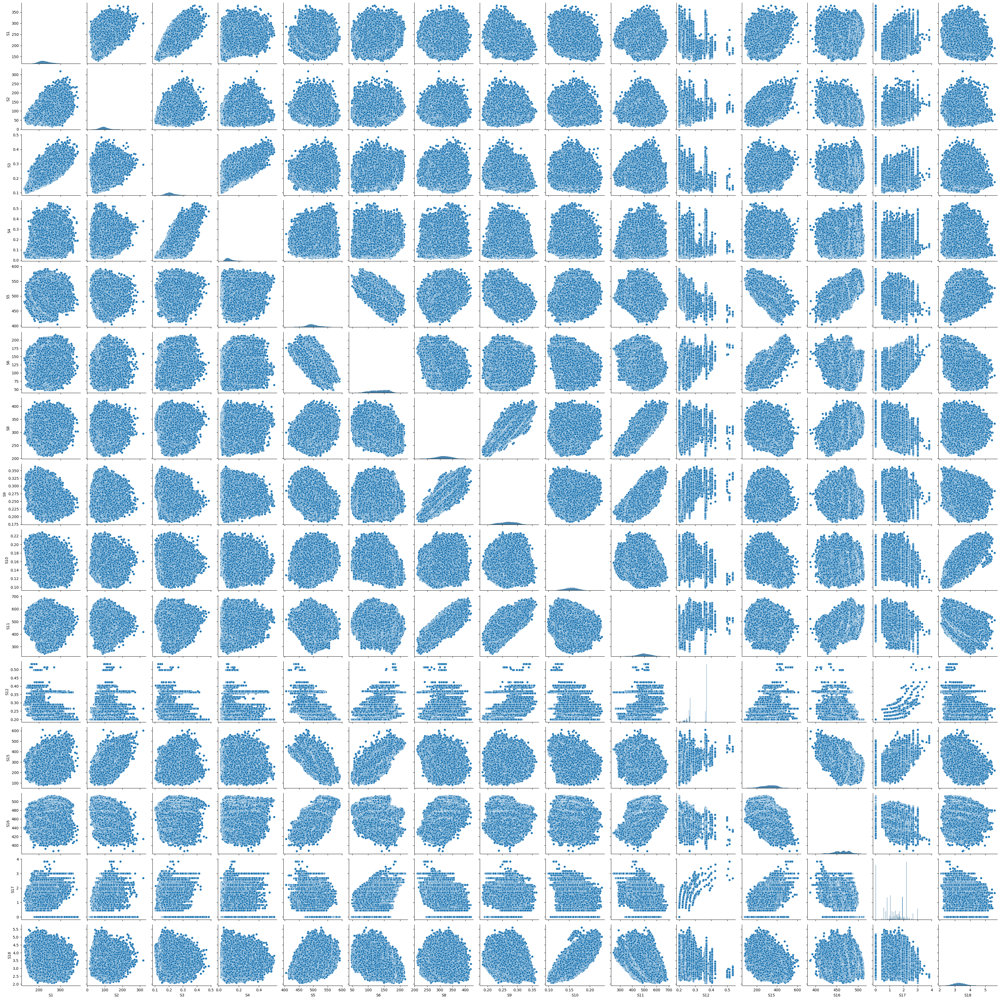

In [24]:
_ = sns.pairplot(data_center_random)

### Separation du jeu de donnée pour l'utilisation des algorithmes 

In [19]:
from sklearn.model_selection import train_test_split
data_center_random_13 = data_center_random.loc["13"]
data_center_cluster_13 = data_center_cluster.loc["13"]
data_coin_random_13 = data_coin_random.loc["13"]
data_coin_cluster_13 = data_coin_cluster.loc["13"]

# Séparation du jeu de donnée

X_1 = data_center_random_13.iloc[:,1:]
y_1 = data_center_random_13.iloc[:,0]

X_2 = data_center_cluster_13.iloc[:,1:]
y_2 = data_center_cluster_13.iloc[:,0]

X_3 = data_coin_random_13.iloc[:,1:]
y_3 = data_coin_random_13.iloc[:,0]

X_4 = data_coin_cluster_13.iloc[:,1:]
y_4 = data_coin_cluster_13.iloc[:,0]

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, train_size = 0.8)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, train_size = 0.8)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X_3, y_3, train_size = 0.8)
X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(X_4, y_4, train_size = 0.8)

# Test des algos 

## Regression lineaire

In [20]:
# LinearRegression

from sklearn.linear_model import LinearRegression

In [21]:
model_linRegMul_1 = LinearRegression()
model_linRegMul_1.fit(X_train_1, y_train_1)
precision1 = model_linRegMul_1.score(X_train_1, y_train_1)
precision2 = model_linRegMul_1.score(X_test_1, y_test_1)

model_linRegMul_2 = LinearRegression()
model_linRegMul_2.fit(X_train_2, y_train_2)
precision3 = model_linRegMul_2.score(X_train_2, y_train_2)
precision4 = model_linRegMul_2.score(X_test_2, y_test_2)

model_linRegMul_3 = LinearRegression()
model_linRegMul_3.fit(X_train_3, y_train_3)
precision5 = model_linRegMul_3.score(X_train_3, y_train_3)
precision6 = model_linRegMul_3.score(X_test_3, y_test_3)

model_linRegMul_4 = LinearRegression()
model_linRegMul_4.fit(X_train_4, y_train_4)
precision7 = model_linRegMul_4.score(X_train_4, y_train_4)
precision8 = model_linRegMul_4.score(X_test_4, y_test_4)

data = {'Center_random': [precision1, precision2], 'Center_cluster':[precision3, precision4] , 'Coin_random': [precision5, precision6], 'Coin_cluster': [precision7, precision8]}
pd.DataFrame( data, 
             index = ['Score train','Score test'])


,Center_random,Center_cluster,Coin_random,Coin_cluster
Score train,0.831234,0.796020,0.873317,0.995401
Score test,0.831274,0.797441,0.875468,0.995309


In [73]:
predictions1 = model_linRegMul_1.predict(X_test_1)
predictions2 = model_linRegMul_1.predict(X_test_2)
predictions3 = model_linRegMul_1.predict(X_test_3)
predictions4 = model_linRegMul_1.predict(X_test_4)

/Users/mac/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibili

<AxesSubplot:xlabel='Coin Cluster', ylabel='Density'>

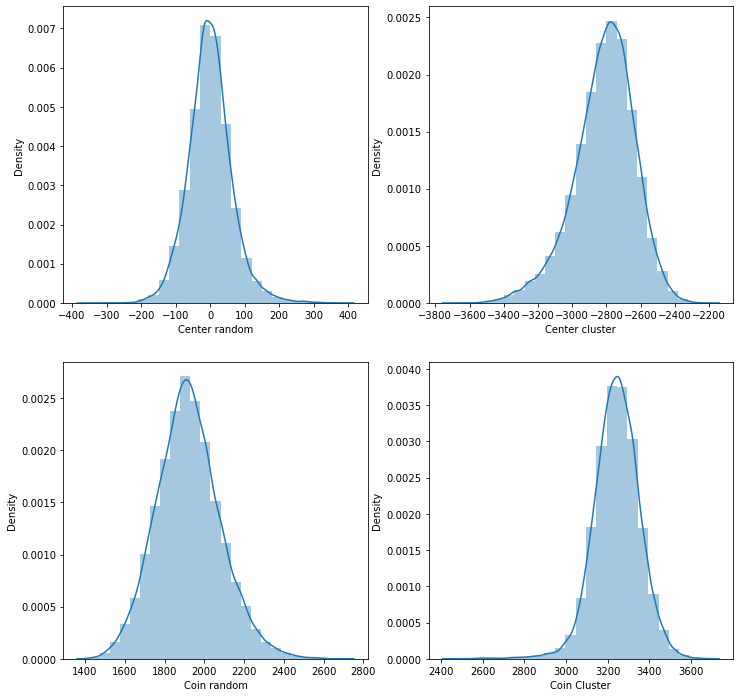

In [74]:

f, axes = plt.subplots(2, 2, figsize=(12,12))


sns.distplot((y_test_1-predictions1),bins=25, ax=axes[0][0], axlabel='Center random')


sns.distplot((y_test_2-predictions2),bins=25, ax=axes[0][1], axlabel='Center cluster')

sns.distplot((y_test_3-predictions3),bins=25, ax=axes[1][0],axlabel='Coin random')

sns.distplot((y_test_4-predictions4),bins=25, ax=axes[1][1], axlabel='Coin Cluster')

/Users/mac/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Score', ylabel='Density'>

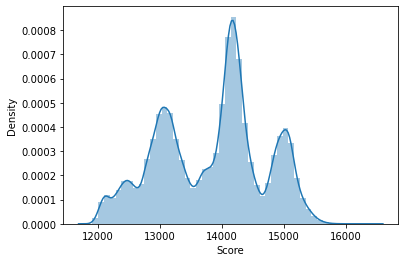

In [66]:
sns.distplot(data_center_random['Score'])

In [76]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test_1, predictions1))
print('MSE:', metrics.mean_squared_error(y_test_1, predictions1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test_1, predictions1)))

MAE: 48.01066318948818
MSE: 4038.7488365790687
RMSE: 63.551151339523884


TypeError: 'str' object is not callable

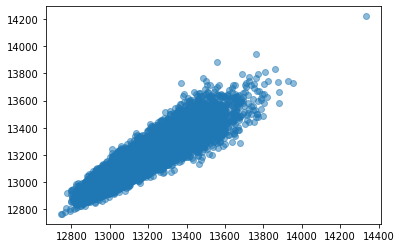

In [107]:
import matplotlib.pyplot as plt
x = y_test_1
y = predictions1
plt.scatter(x, y, alpha=0.5)
plt.xlabel("Y test 1 for Center random")
plt.ylabel("Predicted values")
plt.show()

## KNN Model

In [108]:
# KNN model

from sklearn.neighbors import KNeighborsRegressor

In [ ]:
axis=[i for i in range(2,20)]

res1 = []
res2 = []
res3 = []
res4 = []

for i in range (2,20) :
    modelKNN1 = KNeighborsRegressor(n_neighbors=i).fit(X_train_1.values,y_train_1.values)
    modelKNN2 = KNeighborsRegressor(n_neighbors=i).fit(X_train_2.values,y_train_2.values)
    modelKNN3 = KNeighborsRegressor(n_neighbors=i).fit(X_train_3.values,y_train_3.values)
    modelKNN4 = KNeighborsRegressor(n_neighbors=i).fit(X_train_4.values,y_train_4.values)
    
    accurancyTestKNN1 = modelKNN1.score(X_test_1.values,y_test_1.values)
    accurancyTrainKNN1 = modelKNN1.score(X_train_1.values,y_train_1.values)
    res1.append([accurancyTestKNN1,accurancyTrainKNN1])

    accurancyTestKNN2 = modelKNN2.score(X_test_2.values,y_test_2.values)
    accurancyTrainKNN2 = modelKNN2.score(X_train_2.values,y_train_2.values)
    res2.append([accurancyTestKNN2,accurancyTrainKNN2])
    
    accurancyTestKNN3 = modelKNN3.score(X_test_3.values,y_test_3.values)
    accurancyTrainKNN3 = modelKNN3.score(X_train_3.values,y_train_3.values)
    res3.append([accurancyTestKNN3,accurancyTrainKNN3])
    
    accurancyTestKNN4 = modelKNN4.score(X_test_4.values,y_test_4.values)
    accurancyTrainKNN4 = modelKNN4.score(X_train_4.values,y_train_4.values)
    res4.append([accurancyTestKNN4,accurancyTrainKNN4])
    
A = np.asarray(res1)
B = np.asarray(res2)
C = np.asarray(res3)
D = np.asarray(res4)

In [ ]:
plt.figure()

plt.subplot(2, 2, 1)
plt.title("Center_random")
plt.scatter(axis, A[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, A[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.title("Center_cluster")
plt.scatter(axis, B[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, B[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.title("Coin_random")
plt.scatter(axis, C[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, C[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

plt.subplot(2, 2, 4)
plt.title("Coin_cluster")
plt.scatter(axis, D[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, D[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

On va maintenant choisir k = 5 pour vérifier l'hypothèse sur le choix de K optimale : 

In [123]:
from sklearn.metrics import classification_report,confusion_matrix
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X_train_1,y_train_1)
pred = knn.predict(X_test_1)

print('WITH K=1')
print('\n')
print(confusion_matrix(y_test_1,pred))
print('\n')
print(classification_report(y_test_1,pred))

WITH K=1


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 1 0]]


              precision    recall  f1-score   support

       12747       0.00      0.00      0.00         1
       12750       0.00      0.00      0.00         0
       12751       0.00      0.00      0.00         0
       12752       0.00      0.00      0.00         1
       12765       0.00      0.00      0.00         1
       12767       0.00      0.00      0.00         0
       12770       0.00      0.00      0.00         1
       12773       0.00      0.00      0.00         0
       12775       0.00      0.00      0.00         1
       12780       0.00      0.00      0.00         0
       12785       0.00      0.00      0.00         0
       12789       0.00      0.00      0.00         0
       12790       0.00      0.00      0.00         1
       12792       0.00      0.00      0.00         1
       12794       0.00      0.00      0.00         0
  

/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mac/opt/anaconda3/lib/pyth

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X_train_1,y_train_1)
pred = knn.predict(X_test_1)

print('WITH K=1')
print('\n')
print(confusion_matrix(y_test_1,pred))
print('\n')
print(classification_report(y_test_1,pred))

Le modèle tend vers une precision de 0.73 ce qui n'est pas un super résultat. 

In [29]:
# DRandom Forest Regressor

from sklearn.ensemble import RandomForestRegressor

In [30]:
axis=[i for i in range(3,15)]

res1 = []
res2 = []
res3 = []
res4 = []

for i in range (3,15) :
    modelRF1 = RandomForestRegressor(max_depth=i).fit(X_train_1.values,y_train_1.values)
    accurancyTestRF1 = modelRF1.score(X_test_1.values,y_test_1.values)
    accurancyTrainRF1 = modelRF1.score(X_train_1.values,y_train_1.values)
    res1.append([accurancyTestRF1,accurancyTrainRF1])

    modelRF2 = RandomForestRegressor(max_depth=i).fit(X_train_2.values,y_train_2.values)
    accurancyTestRF2 = modelRF2.score(X_test_2.values,y_test_2.values)
    accurancyTrainRF2 = modelRF2.score(X_train_2.values,y_train_2.values)
    res2.append([accurancyTestRF2,accurancyTrainRF2])
    
    modelRF3 = RandomForestRegressor(max_depth=i).fit(X_train_3.values,y_train_3.values)
    accurancyTestRF3 = modelRF3.score(X_test_3.values,y_test_3.values)
    accurancyTrainRF3 = modelRF3.score(X_train_3.values,y_train_3.values)
    res3.append([accurancyTestRF3,accurancyTrainRF3])
    
    modelRF4 = RandomForestRegressor(max_depth=i).fit(X_train_4.values,y_train_4.values)
    accurancyTestRF4 = modelRF4.score(X_test_4.values,y_test_4.values)
    accurancyTrainRF4 = modelRF4.score(X_train_4.values,y_train_4.values)
    res4.append([accurancyTestRF4,accurancyTrainRF4])
    

E = np.asarray(res1)
F = np.asarray(res2)
G = np.asarray(res3)
H = np.asarray(res4)

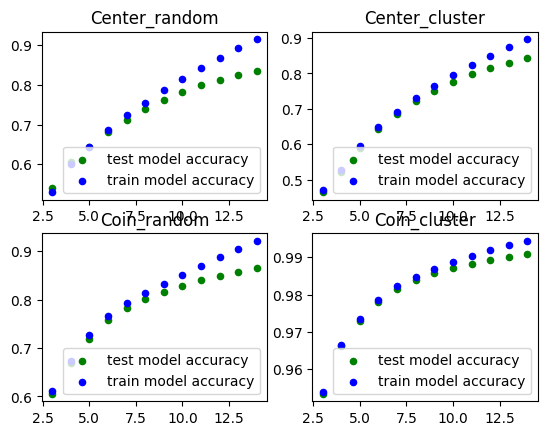

In [32]:
plt.figure()

plt.subplot(2, 2, 1)
plt.title("Center_random")
plt.scatter(axis, E[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, E[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

plt.subplot(2, 2, 2)
plt.title("Center_cluster")
plt.scatter(axis, F[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, F[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

plt.subplot(2, 2, 3)
plt.title("Coin_random")
plt.scatter(axis, G[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, G[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

plt.subplot(2, 2, 4)
plt.title("Coin_cluster")
plt.scatter(axis, H[:,0],c='green', s=20, label='test model accuracy')
plt.scatter(axis, H[:,1],c='blue', s=20, label='train model accuracy')
plt.legend()

In [7]:
# SVM

from sklearn import svm

In [14]:
regr1 = svm.SVR( kernel ='linear', gamma = 'auto')
regr1.fit(X_train_1, y_train_1)
precision1 = regr1.score(X_train_1, y_train_1)
precision2 = regr1.score(X_test_1, y_test_1)

regr2 = svm.SVR( kernel ='linear', gamma = 'auto')
regr2.fit(X_train_2, y_train_2)
precision3 = regr2.score(X_train_2, y_train_2)
precision4 = regr2.score(X_test_2, y_test_2)

regr3 = svm.SVR( kernel ='linear', gamma = 'auto')
regr3.fit(X_train_3, y_train_3)
precision5 = regr3.score(X_train_3, y_train_3)
precision6 = regr3.score(X_test_3, y_test_3)

regr4 = svm.SVR( kernel ='linear', gamma = 'auto')
regr4.fit(X_train_4, y_train_4)
precision7 = regr4.score(X_train_4, y_train_4)
precision8 = regr4.score(X_test_4, y_test_4)

data = {'Center_random': [precision1, precision2], 'Center_cluster':[precision3, precision4], 'Coin_random':[precision5, precision6], 'Coin_cluster':[precision7, precision8]}
pd.DataFrame( data, 
             index = ['Score train','Score test'])

,Center_random,Center_cluster,Coin_random,Coin_cluster
Score train,0.768591,0.782119,0.837528,0.982658
Score test,0.769937,0.782927,0.838737,0.982803


## Decision tree

In [13]:
# Decision Tree

from sklearn.tree import DecisionTreeRegressor

In [14]:
regressor = DecisionTreeRegressor(random_state=0)
regressor.fit(X_train_1, y_train_1)

print('score train :', regressor.score(X_train_1, y_train_1))
print('score test :', regressor.score(X_test_1, y_test_1))

score train : 1.0
score test : 0.6820565013672787


Pour optmiser l'algorithme nous allons chercher les meilleurs parametres parmis tous ceux possibles 

In [15]:
# Hyper parameters range intialization for tuning 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
            "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
            "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
            "max_features":["auto","log2","sqrt",None],
            "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }[]

In [16]:
# calculating different regression metrics

from sklearn.model_selection import GridSearchCV

In [17]:
tuning_model=GridSearchCV(regressor,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)

In [19]:
# function for calculating how much time take for hyperparameter tuning

def timer(start_time=None):
    if not start_time:
        start_time=datetime.now()
        return start_time
    elif start_time:
        thour,temp_sec=divmod((datetime.now()-start_time).total_seconds(),3600)
        tmin,tsec=divmod(temp_sec,60)
        #print(thour,":",tmin,':',round(tsec,2))

In [20]:
%%capture
from datetime import datetime

start_time=timer(None)

tuning_model.fit(X_train_1,y_train_1)

timer(start_time)

In [21]:
# best hyperparameters 

tuning_model.best_params_

{'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [24]:
new_regressor = DecisionTreeRegressor(max_depth =5,max_leaf_nodes = None, min_samples_leaf =1, min_weight_fraction_leaf =0.1,splitter = 'best')

In [28]:
new_regressor.fit(X_train_1, y_train_1)

precision1 = new_regressor.score(X_train_1, y_train_1)
precision2 = new_regressor.score(X_test_1, y_test_1)

new_regressor.fit(X_train_2, y_train_2)

precision3 = new_regressor.score(X_train_2, y_train_2)
precision4 = new_regressor.score(X_test_2, y_test_2)

new_regressor.fit(X_train_3, y_train_3)

precision5 = new_regressor.score(X_train_3, y_train_3)
precision6 = new_regressor.score(X_test_3, y_test_3)

new_regressor.fit(X_train_4, y_train_4)

precision7 = new_regressor.score(X_train_4, y_train_4)
precision8 = new_regressor.score(X_test_4, y_test_4)

data = {'Center_random': [precision1, precision2], 'Center_cluster':[precision3, precision4], 'Coin_random':[precision5, precision6], 'Coin_cluster':[precision7, precision8]}
pd.DataFrame( data, 
             index = ['Score train','Score test'])

,Center_random,Center_cluster,Coin_random,Coin_cluster
Score train,0.437062,0.441409,0.499176,0.916103
Score test,0.437630,0.446315,0.501479,0.919615


## Gradient boosting

In [29]:
# Gradient boosting

from sklearn.ensemble import GradientBoostingRegressor

In [32]:
regr = GradientBoostingRegressor()

regr = regr.fit(X_train_1, y_train_1)
precision1 = regr.score(X_train_1, y_train_1)
precision2 = regr.score(X_test_1, y_test_1)

regr.fit(X_train_2, y_train_2)
precision3 = regr.score(X_train_2, y_train_2)
precision4 = regr.score(X_test_2, y_test_2)

regr.fit(X_train_3, y_train_3)
precision5 = regr.score(X_train_3, y_train_3)
precision6 = regr.score(X_test_3, y_test_3)

regr.fit(X_train_4, y_train_4)
precision7 = regr.score(X_train_4, y_train_4)
precision8 = regr.score(X_test_4, y_test_4)

data = {'Center_random': [precision1, precision2], 'Center_cluster':[precision3, precision4], 'Coin_random':[precision5, precision6], 'Coin_cluster':[precision7, precision8]}
pd.DataFrame( data, 
             index = ['Score train','Score test'])

,Center_random,Center_cluster,Coin_random,Coin_cluster
Score train,0.788646,0.773311,0.841613,0.986751
Score test,0.782357,0.771473,0.836164,0.986210


## Neural Network

In [21]:
# Mise en place du réseau de neuronnes 
# Nb de neuronnes d'entrées et de sorties

input_shape = X_1.shape[1]
output_shape = 1 

In [22]:
# we set up our input layer
inputs = Input(shape=(input_shape,))

# we add 3 hidden layers with diminishing size. This is a common practice in designing a neural network
# as the features get more and more abstracted, we need less and less neurons.

h = Dense(16, activation="relu")(inputs)
h = Dense(8, activation="relu")(h)
h = Dense(4, activation="relu")(h)

# and finally we use the ReLU activation function on the output layer
out = Dense(output_shape, activation="relu")(h)

model = Sequential()
model.add(Dense(units=5, input_dim=15, kernel_initializer='normal', activation='relu'))
model.add(Dense(units=5, kernel_initializer='normal', activation='relu'))
model.add(Dense(1, kernel_initializer='normal'))

model.summary()

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_79 (Dense)            (None, 5)                 80        
                                                                 
 dense_80 (Dense)            (None, 5)                 30        
                                                                 
 dense_81 (Dense)            (None, 1)                 6         
                                                                 
Total params: 116
Trainable params: 116
Non-trainable params: 0
_________________________________________________________________


In [23]:
model.compile(optimizer="adam", loss="mean_squared_error")

In [25]:
H = model.fit(X_train_1,y_train_1,epochs=100,batch_size = 20,verbose = 0)

KeyError: 'val_loss'

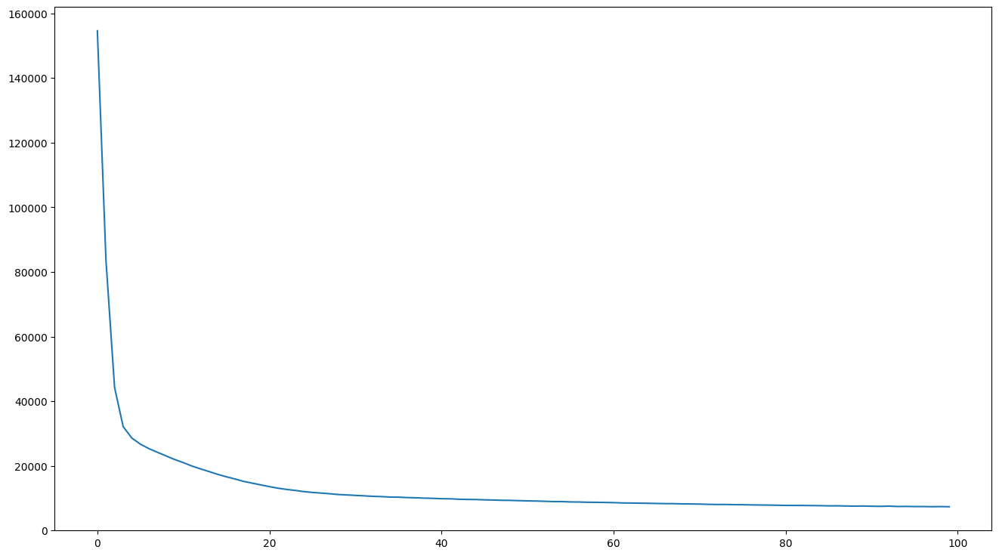

In [26]:
fig = plt.figure(figsize=(16, 9))
plt.plot(H.history["loss"], label="loss")
plt.plot(H.history["val_loss"], label="validation loss")
plt.show()

In [10]:
def FunctionFindBestParams(X_train_1, y_train_1, X_test_1, y_test_1):
    
    # Defining the list of hyper parameters to try
    batch_size_list=[5, 10, 15, 20]
    epoch_list  =   [5, 10, 50, 100]
    
    import pandas as pd
    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])
    
    # initializing the trials
    TrialNumber=0
    for batch_size_trial in batch_size_list:
        for epochs_trial in epoch_list:
            TrialNumber+=1
            # create ANN model
            model = Sequential()
            # Defining the first layer of the model
            model.add(Dense(units=5, input_dim=X_train_1.shape[1], kernel_initializer='normal', activation='relu'))
 
            # Defining the Second layer of the model
            model.add(Dense(units=5, kernel_initializer='normal', activation='relu'))
 
            # The output neuron is a single fully connected node 
            # Since we will be predicting a single number
            model.add(Dense(1, kernel_initializer='normal'))
 
            # Compiling the model
            model.compile(loss='mean_squared_error', optimizer='adam')
 
            # Fitting the ANN to the Training set
            model.fit(X_train_1, y_train_1 ,batch_size = batch_size_trial, epochs = epochs_trial, verbose=0)
 
            MAPE = np.mean(100 * (np.abs(y_test_1 - (model.predict(X_test_1)).flatten())/y_test_1))
            
            # printing the results of the current iteration
            print(TrialNumber, 'Parameters:','batch_size:', batch_size_trial,'-', 'epochs:',epochs_trial, 'Accuracy:', 100-MAPE)
            
            SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],
                                                                    columns=['TrialNumber', 'Parameters', 'Accuracy'] ))
    return(SearchResultsData)
 
 
######################################################
# Calling the function
ResultsData=FunctionFindBestParams(X_train_1, y_train_1, X_test_1, y_test_1)

581/581 [==============================] - 0s 268us/step
1 Parameters: batch_size: 5 - epochs: 5 Accuracy: 0.56529757357454


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 284us/step
2 Parameters: batch_size: 5 - epochs: 10 Accuracy: 99.35881969134357


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 265us/step
3 Parameters: batch_size: 5 - epochs: 50 Accuracy: 99.49868846683529


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 271us/step
4 Parameters: batch_size: 5 - epochs: 100 Accuracy: 99.48309754447861


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 264us/step
5 Parameters: batch_size: 10 - epochs: 5 Accuracy: 99.11494388347094


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 294us/step
6 Parameters: batch_size: 10 - epochs: 10 Accuracy: 99.19348645852492


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 296us/step
7 Parameters: batch_size: 10 - epochs: 50 Accuracy: 99.48448339247335


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 298us/step
8 Parameters: batch_size: 10 - epochs: 100 Accuracy: 99.50722891849708


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 293us/step
9 Parameters: batch_size: 15 - epochs: 5 Accuracy: 0.18847588210880417


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 295us/step
10 Parameters: batch_size: 15 - epochs: 10 Accuracy: 99.13673831388901


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 308us/step
11 Parameters: batch_size: 15 - epochs: 50 Accuracy: 99.46269944209224


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 259us/step
12 Parameters: batch_size: 15 - epochs: 100 Accuracy: 99.5099506679083


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 293us/step
13 Parameters: batch_size: 20 - epochs: 5 Accuracy: 98.91323023627301


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 259us/step
14 Parameters: batch_size: 20 - epochs: 10 Accuracy: 99.10695817696167


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 258us/step
15 Parameters: batch_size: 20 - epochs: 50 Accuracy: 99.45527572948744


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


581/581 [==============================] - 0s 281us/step
16 Parameters: batch_size: 20 - epochs: 100 Accuracy: 99.51726716514504


/var/folders/t6/t5h5090d6mb3hs8y3fgw7s8c0000gn/T/ipykernel_1213/3633485223.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],


<AxesSubplot:xlabel='Parameters'>

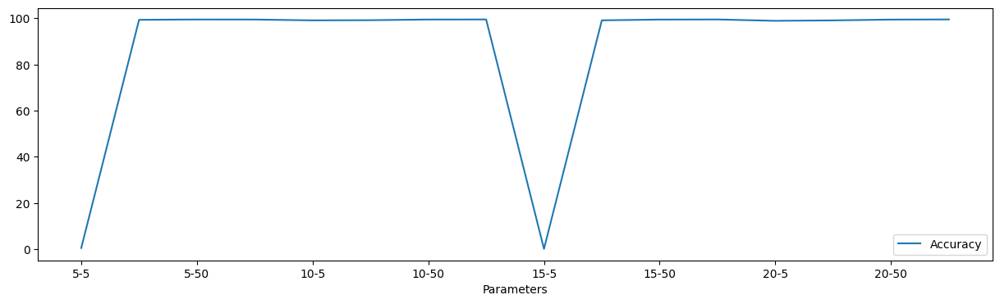

In [11]:
%matplotlib inline
ResultsData.plot(x='Parameters', y='Accuracy', figsize=(15,4), kind='line')

In [17]:
model = Sequential()
model.add(Dense(units=5, input_dim=X_train_1.shape[1], kernel_initializer='normal', activation='relu'))
model.add(Dense(units=5, kernel_initializer='normal', activation='relu'))
model.add(Dense(1, kernel_initializer='normal'))
model.compile(loss='mean_squared_error', optimizer='adam')


# Fitting the ANN to the Training set
model.fit(X_train_1, y_train_1 ,batch_size = 20, epochs = 100, verbose=0)
 
# Generating Predictions on testing data
Predictions=model.predict(X_test_1)

y_test_orig= y_test_1
 
# Scaling the test data back to original scale
 
TestingData=pd.DataFrame(data=X_test_1)
TestingData['Score']=y_test_orig
TestingData['PredictedScore']=Predictions
TestingData.head()

581/581 [==============================] - 0s 256us/step


,S1,S2,S3,S4,S5,S6,S8,S9,S10,S11,S12,S15,S16,S17,S18,Score,PredictedScore
65128,247.939,94.8104,0.2263,0.1018,539.2,82.3733,290.5,0.2180,0.1753,380.4,0.2,184.581,477.719,0.0,4.2389,13108,13142.300781
20758,240.934,52.7384,0.2795,0.2453,526.7,96.9454,326.9,0.2485,0.1443,511.1,0.2,206.427,485.432,0.0,3.1167,13006,13126.307617
84108,238.833,63.6947,0.2584,0.1580,535.9,90.8828,321.6,0.2435,0.1376,476.7,0.2,200.878,479.772,0.0,3.3222,13197,13102.451172
51706,272.974,145.8590,0.2561,0.2126,541.5,85.1554,321.8,0.2404,0.1621,447.3,0.2,176.718,469.661,0.0,3.8000,13271,13378.205078
64453,219.475,56.9193,0.2813,0.3340,536.2,100.1980,306.1,0.2320,0.1535,441.5,0.2,181.071,481.892,0.0,3.7611,13203,13092.856445


In [20]:
y_pred_1 = Predictions
print(f"RMSE: {np.sqrt(mean_squared_error(y_test_1, y_pred_1))}")
print(f"MAE: {mean_absolute_error(y_test_1, y_pred_1)}")
print(f"R2: {r2_score(y_test_1, y_pred_1)}")

RMSE: 92.5708052529632
MAE: 71.31449930488232
R2: 0.6424269634234206


## Regression logistique

Pour utiliser la regression logistique il faut au maximum trois résultats possibles
En prenant des valeurs 

In [16]:
data = {'Center_random': data_center_random.Score.describe(), 'Center_cluster':data_center_cluster.Score.describe() , 'Coin_random': data_coin_random.Score.describe(), 'Coin_cluster': data_coin_cluster.Score.describe()}
pd.DataFrame( data,
             index = ['count','mean', 'std', 'min', '25%', '50%', '75%', 'max'])

,Center_random,Center_cluster,Coin_random,Coin_cluster
count,2.536722e+06,3.302699e+06,4.137693e+06,4.132400e+06
mean,1.383565e+04,1.073829e+04,2.175919e+04,1.999346e+04
std,8.422074e+02,1.414708e+03,1.991921e+03,3.379610e+03
min,1.181600e+04,7.766000e+03,1.807700e+04,1.161500e+04
25%,1.311500e+04,9.804000e+03,2.048900e+04,1.720800e+04
50%,1.402200e+04,1.068000e+04,2.181900e+04,2.036800e+04
75%,1.436800e+04,1.191000e+04,2.272500e+04,2.256600e+04
max,1.646600e+04,1.505000e+04,2.648200e+04,2.758800e+04


Text(0.5, 1.0, 'Score coin_cluster')

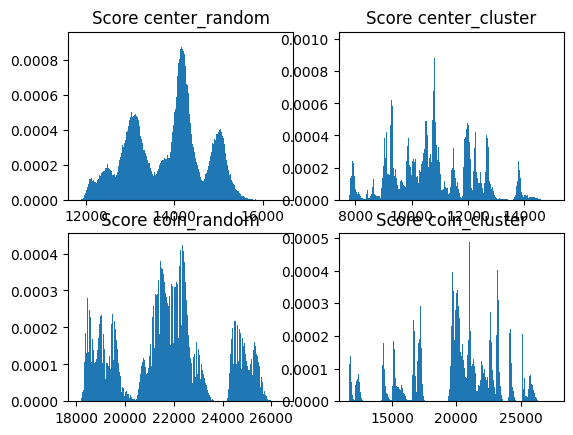

In [15]:
plt.figure()

plt.subplot(2,2,1)
plt.hist(data_center_random['Score'],bins=4650, density=True)
plt.title("Score center_random")

plt.subplot(2,2,2)
plt.hist(data_center_cluster['Score'],bins=4650, density=True)
plt.title("Score center_cluster")

plt.subplot(2,2,3)
plt.hist(data_coin_random['Score'],bins=4650, density=True)
plt.title("Score coin_random")

plt.subplot(2,2,4)
plt.hist(data_coin_cluster['Score'],bins=4650, density=True)
plt.title("Score coin_cluster")

Possibilité de séparer les données en 3 groupes moins de 13500 entre 13500 et 14700 et plus de 14700

Pour l'application de regression logistique

In [17]:
data_center_random.Score = pd.cut(data_center_random.Score,bins=[0,13500,14700, 16466],labels=[1, 2 ,3])
data_center_random

Score       S1        S2      S3      S4       S5        S6       S8  \
01 0         2  295.560   72.5364  0.3585  0.2242  534.100  155.2950  373.500   
   1         2  263.942   70.5388  0.3668  0.3410  565.500  102.2150  384.000   
   2         2  193.560   89.4947  0.1567  0.0728  564.455   88.8782  329.091   
   3         2  310.649  238.1830  0.2875  0.2317  560.100  108.5510  352.700   
   4         2  216.225  111.4190  0.2114  0.1549  554.545  105.1900  336.636   
...        ...      ...       ...     ...     ...      ...       ...      ...   
27 80789     2  239.254  102.9270  0.2193  0.0908  452.583  164.3310  304.083   
   80790     2  242.110  127.5520  0.2197  0.1306  449.333  168.3720  302.500   
   80791     2  212.116  118.4680  0.1896  0.1194  471.333  166.8520  294.667   
   80792     2  218.618  106.8050  0.2133  0.1338  460.500  155.2600  309.667   
   80793     2  220.144  126.4250  0.2056  0.1078  469.333  154.6040  316.083   

              S9     S10      S11     S12      S15      S16     S17     S18  
01 0      0.2458  0.1806  518.800  0.2000  439.014  466.629  0.0000  3.6056  
   1      0.2643  0.1923  488.000  0.2000  247.544  484.155  0.0000  4.1944  
   2      0.2626  0.1863  422.091  0.2288  202.453  485.022  1.4431  4.3984  
   3      0.2409  0.1707  492.700  0.2000  372.134  471.865  0.0000  4.0722  
   4      0.2656  0.1693  470.182  0.2288  207.462  489.567  1.4431  3.9949  
...          ...     ...      ...     ...      ...      ...     ...     ...  
27 80789  0.2780  0.1347  513.583  0.2894  411.860  448.295  1.9293  2.7188  
   80790  0.2748  0.1329  526.667  0.2894  431.032  451.187  1.9293  2.6339  
   80791  0.2746  0.1367  457.833  0.3704  406.753  444.291  2.2111  3.2500  
   80792  0.2846  0.1352  480.917  0.3704  389.807  443.426  2.2111  2.9740  
   80793  0.2889  0.1354  503.167  0.2894  391.863  444.107  1.9293  2.7552  

[2536722 rows x 16 columns]

In [15]:
from sklearn import linear_model

In [16]:
data13 = data.loc["13"]

# Séparation du jeu de donnée

X = data13.iloc[:,1:]
y = data13.iloc[:,0]

X_train, X_test, y_train, y_test = train_test_split(X,y, train_size = 0.8)

In [17]:
data13

,Score,S1,S2,S3,S4,S5,S6,S8,S9,S10,S11,S12,S15,S16,S17,S18
0,2,252.022,111.7470,0.2369,0.0945,516.182,106.7560,303.091,0.2487,0.1502,449.182,0.2293,281.482,458.433,1.5048,3.8509
1,2,303.966,136.2290,0.3473,0.2876,550.400,80.1314,357.800,0.2511,0.1626,486.100,0.2000,208.925,462.385,0.0000,4.2833
2,2,229.636,102.8110,0.2032,0.0686,508.546,107.7470,327.364,0.2655,0.1515,508.454,0.2300,285.708,467.615,1.5641,3.2538
3,2,318.551,255.1060,0.3266,0.2991,541.000,86.1824,344.000,0.2449,0.1857,418.200,0.2000,330.240,444.445,0.0000,4.4444
4,2,215.316,93.0992,0.2037,0.0605,524.909,96.4963,277.000,0.2272,0.1733,422.273,0.2283,272.587,462.317,1.5048,4.0737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92828,1,242.249,42.2973,0.2314,0.0920,535.900,90.8828,292.600,0.2235,0.1540,435.200,0.2000,215.801,480.949,0.0000,3.5778
92829,1,234.040,62.8735,0.2612,0.2496,532.700,101.7560,305.700,0.2340,0.1516,474.100,0.2000,216.160,484.498,0.0000,3.2500
92830,1,223.424,64.5856,0.2228,0.1406,538.900,85.1944,329.000,0.2523,0.1528,468.600,0.2000,208.900,481.388,0.0000,3.2944
92831,1,256.021,79.8833,0.2157,0.0541,536.300,93.8606,291.900,0.2269,0.1768,388.700,0.2000,218.978,477.356,0.0000,4.1167


In [24]:
modele_regLog = linear_model.LogisticRegression(random_state = 0,solver = 'liblinear', multi_class = 'auto')
modele_regLog.fit(X_train, y_train)
print('test :', modele_regLog.score(X_test, y_test))
print('train :', modele_regLog.score(X_train, y_train))

test : 0.9766790542360101
train : 0.977567123582797
